In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Utils

## Wall time graph per thread

In [ ]:
# Data from threads.txt
threads = [1, 2, 4, 8, 16, 32]
wall_times = [0.026984, 0.218081, 0.294457, 62.157721, 13.859680, 16.510838]

def plot_execution_times(threads, wall_times):
    # Create figure with higher resolution
    plt.figure(figsize=(12, 8), dpi=100)

    # Set style
    plt.style.use('default')

    # Create bar chart with line overlay
    bars = plt.bar(threads, wall_times, width=0.7, 
            color='#4c72b0', edgecolor='black', linewidth=1.5, alpha=0.7)

    # Add line plot on top
    plt.plot(threads, wall_times, marker='o', linestyle='-', linewidth=3, 
            markersize=10, color='#d62728', markerfacecolor='white', 
            markeredgewidth=2)

    # Customize the appearance
    plt.yscale('log')  # Use logarithmic scale for the huge variation
    plt.grid(True, linestyle='--', alpha=0.7)

    # Add title and labels
    plt.title('Tempo de Execução vs Número de Threads (OpenMP)', 
            fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Número de Threads', fontsize=16, fontweight='bold')
    plt.ylabel('Tempo de Execução (ms) - Escala Logarítmica', fontsize=16, fontweight='bold')

    # Set x-tick labels to the thread counts
    plt.xticks(threads, threads, fontsize=14)
    plt.yticks(fontsize=14)

    # Add value labels on top of each bar
    for i, thread in enumerate(threads):
        plt.text(thread, wall_times[i] * 1.1,
                f'{wall_times[i]:.4f}',
                ha='center', va='bottom', fontsize=12, fontweight='bold')

    # Highlight the unexpected pattern with annotations
    plt.annotate('Pico de sobrecarga', xy=(8, wall_times[3]), 
                xytext=(12, wall_times[3]/2),
                arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=-.2", linewidth=2),
                fontsize=14, fontweight='bold')

    plt.annotate('Mais eficiente', xy=(1, wall_times[0]), 
                xytext=(2, wall_times[0]/5),
                arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", linewidth=2),
                fontsize=14, fontweight='bold')

    # Add a horizontal line showing the single thread performance for reference
    plt.axhline(y=wall_times[0], color='red', linestyle='--', 
            label=f'Referência de thread única: {wall_times[0]:.4f} ms')

    # Add explanatory text
    plt.figtext(0.5, 0.01, 
            'K-means 1D em conjunto de dados pequeno (N=20, K=4)\nSobrecarga de paralelização excede os benefícios computacionais para este tamanho pequeno de problema',
            ha='center', fontsize=14, fontstyle='italic')

    plt.legend(loc='upper right', fontsize=14)

    # Adjust layout
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])

    # Show the plot
    plt.show()

## Chunk size and schedule (static or dynamic) graph

In [13]:
# Data for chunk sizes and execution times
chunk_sizes = [32, 64, 128, 256, 512]
dynamic_times = [0.029392, 0.036757, 0.024830, 0.023377, 0.022148]
static_times = [0.027501, 0.022183, 0.022475, 0.022585, 0.022072]

def plot_chunk_size_comparison(chunk_sizes, dynamic_times, static_times):
    # Create figure with high resolution
    plt.figure(figsize=(12, 8), dpi=120)
    
    # Set default style and enable grid
    plt.style.use('default')
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Define x positions and bar width for grouped bars
    x = np.arange(len(chunk_sizes))
    bar_width = 0.35
    
    # Create grouped bar chart for dynamic and static scheduling
    dynamic_bars = plt.bar(x - bar_width/2, dynamic_times, bar_width, label='Escalonamento Dinâmico', 
                         color='#4c72b0', edgecolor='black', linewidth=1.5, alpha=0.7)
    static_bars = plt.bar(x + bar_width/2, static_times, bar_width, label='Escalonamento Estático', 
                        color='#d62728', edgecolor='black', linewidth=1.5, alpha=0.7)
    
    # Add title and axis labels
    title = plt.title('Comparação de Desempenho: Escalonamento Estático vs Dinâmico (OpenMP)', 
           fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Tamanho do Chunk', fontsize=16, fontweight='bold')
    plt.ylabel('Tempo de Execução (ms)', fontsize=16, fontweight='bold')
    
    # Set x and y tick labels
    plt.xticks(x, chunk_sizes, fontsize=14)
    plt.yticks(fontsize=14)
    
    # Add value labels on top of each dynamic scheduling bar
    for i, v in enumerate(dynamic_times):
        plt.text(i - bar_width/2, v + 0.0008, f'{v:.4f}', 
               ha='center', va='bottom', fontsize=10, 
               fontweight='bold', color='black')
    
    # Add value labels on top of each static scheduling bar
    for i, v in enumerate(static_times):
        plt.text(i + bar_width/2, v + 0.0008, f'{v:.4f}', 
               ha='center', va='bottom', fontsize=10,
               fontweight='bold', color='black')
    
    # Find the best performance for each scheduler type
    min_dynamic = min(dynamic_times)
    min_dynamic_idx = dynamic_times.index(min_dynamic)
    min_static = min(static_times)
    min_static_idx = static_times.index(min_static)
    
    # Determine overall best time and scheduler
    best_time = min(min_dynamic, min_static)
    best_scheduler = "Dinâmico" if min_dynamic <= min_static else "Estático"
    best_chunk = chunk_sizes[dynamic_times.index(min_dynamic)] if best_scheduler == "Dinâmico" else chunk_sizes[static_times.index(min_static)]
    
    # Add annotation to highlight best performance
    plt.annotate('Melhor desempenho', 
              xy=(min_static_idx + bar_width/2 if best_scheduler == "Estático" else min_dynamic_idx - bar_width/2, best_time),
              xytext=(len(chunk_sizes)-2, 0.030),
              arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=-.2", linewidth=2),
              fontsize=12, fontweight='bold', 
              bbox=dict(boxstyle="round,pad=0.4", edgecolor="black", facecolor="white", alpha=0.9))
    
    # Add horizontal reference line for best time
    plt.axhline(y=best_time, color='red', linestyle='--', alpha=0.7,
             label=f'Melhor tempo: {best_time:.4f} ms')
    
    # Add explanatory text at bottom
    explanation = plt.figtext(0.5, 0.01, 
             'K-means 1D em conjunto de dados pequeno (N=20, K=4)\nComparação de diferentes estratégias de escalonamento e tamanhos de chunk com OpenMP',
             ha='center', fontsize=14, fontstyle='italic')
    
    # Add legend
    plt.legend(loc='upper right', fontsize=14)
    
    # Adjust layout to prevent overlapping
    plt.tight_layout(rect=[0, 0.05, 1, 0.95])
    
    # Display the plot
    plt.show()

## K-means before and after graph

In [97]:
def visualize_kmeans_1d(points, initial_centers, assignments, final_centroids, N, K, algorithm_name=""):
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10), dpi=120)
    
    # Generate colors dynamically based on number of clusters K
    # Use a colormap to generate distinct colors
    cmap = plt.cm.get_cmap('tab20' if K <= 20 else 'gist_rainbow', K)
    colors = [cmap(i) for i in range(K)]
    
    # ---- BEFORE K-means plot ----
    np.random.seed(42)  # For reproducible jitter
    y_before = np.random.normal(0, 0.05, size=len(points))

    # Plot data points
    ax1.scatter(points, y_before, alpha=0.7, s=100, c='#1f77b4', 
            edgecolor='black', linewidth=0.5, label='Pontos de Dados')

    # Plot initial centroids
    for i, center in enumerate(initial_centers):
        ax1.scatter(center, 0, color=colors[i], s=200, marker='D', 
                edgecolor='black', linewidth=1.5, zorder=3, 
                label=f'Centroide Inicial {i}: {center:.4f}')
        ax1.plot([center, center], [-0.15, 0.15], 'k--', alpha=0.5)

    # Customize first plot
    ax1.set_title('Antes do Agrupamento K-means', fontsize=18, fontweight='bold', pad=15)
    ax1.set_xlabel('Valor', fontsize=14, fontweight='bold')
    ax1.set_yticks([])  # Hide y-axis ticks
    ax1.grid(True, linestyle='--', alpha=0.7, axis='x')
    
    # Adjust legend placement based on number of centers
    if K <= 4:
        ax1.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0)
    else:
        # For many clusters, place legend below the plot
        ax1.legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.5, -0.15),
                  ncol=min(5, K), borderaxespad=3)
    
    ax1.set_ylim(-0.2, 0.2)

    # ---- AFTER K-means plot ----
    y_after = np.random.normal(0, 0.05, size=len(points))

    # Plot points with their cluster colors
    for i in range(K):  # For each cluster - now using K instead of hardcoded 4
        cluster_points = points[assignments == i]
        cluster_y = y_after[assignments == i]
        if len(cluster_points) > 0:
            ax2.scatter(cluster_points, cluster_y, alpha=0.7, s=100, c=colors[i], 
                    edgecolor='black', linewidth=0.5, 
                    label=f'Cluster {i} ({len(cluster_points)} pontos)')

    # Plot final centroids
    for i, centroid in enumerate(final_centroids):
        ax2.scatter(centroid, 0, color=colors[i], s=200, marker='X', 
                edgecolor='black', linewidth=1.5, zorder=3, 
                label=f'Centroide Final {i}: {centroid:.4f}')
        ax2.plot([centroid, centroid], [-0.15, 0.15], 'k--', alpha=0.5)

    # Customize second plot
    ax2.set_title('Após o Agrupamento K-means', fontsize=18, fontweight='bold', pad=15)
    ax2.set_xlabel('Valor', fontsize=14, fontweight='bold')
    ax2.set_yticks([])
    ax2.grid(True, linestyle='--', alpha=0.7, axis='x')
    
    # Adjust legend placement based on number of centers
    if K <= 4:
        ax2.legend(fontsize=12, loc='upper left', bbox_to_anchor=(1.02, 1), borderaxespad=0)
    else:
        # For many clusters, place legend below the plot with multiple columns
        ax2.legend(fontsize=10, loc='upper center', bbox_to_anchor=(0.5, -0.15),
                  ncol=min(5, K), borderaxespad=3)
    
    ax2.set_ylim(-0.2, 0.2)

    # Add overall title and description
    plt.suptitle(f'Agrupamento K-means em 1D {algorithm_name}', fontsize=20, fontweight='bold', y=0.98)
    plt.figtext(0.5, 0.01, f'Visualização do agrupamento K-means em um conjunto de dados 1D (N = {N}, K = {K})\n'
            'O algoritmo agrupa pontos similares e atualiza os centroides para minimizar a distância intra-cluster',
            ha='center', fontsize=12, fontstyle='italic')

    # Set x-axis limits to show all data with padding
    all_values = np.concatenate([points, initial_centers, final_centroids])
    min_val, max_val = min(all_values), max(all_values)
    padding = (max_val - min_val) * 0.05
    ax1.set_xlim(min_val - padding, max_val + padding)
    ax2.set_xlim(min_val - padding, max_val + padding)

    # Adjust layout for different numbers of clusters
    if K <= 4:
        plt.tight_layout(rect=[0, 0.03, 0.85, 0.96])  # Original layout with legend on right
    else:
        plt.tight_layout(rect=[0, 0.08, 1, 0.96])  # Adjusted layout with legend below
    
    plt.show()

## K-means convergence graph

In [30]:
def plot_kmeans_convergence(iterations, sse_values):
    # Create figure with high resolution
    plt.figure(figsize=(12, 8), dpi=120)
    
    # Set style
    plt.style.use('default')
    
    # Create the convergence plot
    plt.plot(iterations, sse_values, marker='o', linestyle='-', linewidth=3, 
             markersize=10, color='#4c72b0', markerfacecolor='white', 
             markeredgewidth=2)
    
    # Fill area under the curve
    plt.fill_between(iterations, sse_values, alpha=0.3, color='#4c72b0')
    
    # Customize the appearance
    plt.yscale('log')  # Use logarithmic scale to better visualize the convergence
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Add title and labels
    plt.title('Convergência do K-means: SSE por Iteração', 
              fontsize=18, fontweight='bold', pad=20)
    plt.xlabel('Iteração', fontsize=16, fontweight='bold', labelpad=15)
    plt.ylabel('SSE - Escala Logarítmica', fontsize=16, fontweight='bold')
    
    # Set axis properties
    plt.xticks(iterations, fontsize=14)
    plt.yticks(fontsize=14)
    
    # Add value labels on each point - special handling for first point
    for i, value in enumerate(sse_values):
        if i == 0:  # Special handling for first point - position it inside the plot
            plt.text(iterations[i], value * 0.85, f'{value:.1f}', 
                    ha='center', va='top', fontsize=10, fontweight='bold', rotation=90)
        else:  # Normal handling for other points
            plt.text(iterations[i], value * 1.1, f'{value:.4f}', 
                    ha='center', va='bottom', fontsize=10, fontweight='bold', rotation=-75)
    
    # Add explanatory text - increased position from 0.01 to 0.03
    plt.figtext(0.5, 0.03, 
                'Convergência do algoritmo K-means em conjunto de dados 1D (N=10000, K=4)\n'
                'O SSE diminui drasticamente nas primeiras iterações e estabiliza após a iteração 4',
                ha='center', fontsize=14, fontstyle='italic')
    
    # Adjust left margin to accommodate the y-label and bottom margin for explanatory text
    plt.subplots_adjust(left=0.15)  # Add more space for y-label
    plt.tight_layout(rect=[0.05, 0.08, 1, 0.95])  # Increased left margin from 0 to 0.05
    
    # Show the plot
    plt.show()

## OpenMP all-in-one graph, threads, chunk sizes and scheduling process

In [38]:
def plot_openmp_performance(threads, chunk_sizes, static_times, dynamic_times):
    # Create figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10), dpi=120)

    # Line styles and markers
    markers = ['o', 's', 'D', '^', 'v']
    colors = plt.cm.tab10(np.linspace(0, 1, len(threads)))

    # Plot Static Scheduling
    for i, thread in enumerate(threads):
        ax1.plot(chunk_sizes, static_times[i], marker=markers[i], linestyle='-', 
                label=f'{thread} Threads', color=colors[i], 
                linewidth=3, markersize=10, markerfacecolor='white', markeredgewidth=2)

    # Plot Dynamic Scheduling
    for i, thread in enumerate(threads):
        ax2.plot(chunk_sizes, dynamic_times[i], marker=markers[i], linestyle='-', 
                label=f'{thread} Threads', color=colors[i], 
                linewidth=3, markersize=10, markerfacecolor='white', markeredgewidth=2)

    # Format the plots
    for ax, title in zip([ax1, ax2], ['Estático', 'Dinâmico']):
        ax.set_title(f"Escalonamento {title} - Tempo de Execução do K-means 1D", 
                    fontsize=18, fontweight='bold')
        ax.set_xlabel("Tamanho do Chunk", fontsize=16, fontweight='bold')
        ax.set_ylabel("Tempo de Execução (ms) - Escala Logarítmica", fontsize=16, fontweight='bold')
        ax.set_yscale('log')
        ax.set_xticks(chunk_sizes)
        ax.set_xticklabels(chunk_sizes, fontsize=14)
        ax.grid(True, linestyle='--', alpha=0.7)
        ax.legend(fontsize=14, loc='upper center', bbox_to_anchor=(0.5, -0.12), ncol=5)
        
        # Find and mark best configuration in this scheduling type
        min_idx = np.unravel_index(np.argmin(static_times if title == 'Estático' else dynamic_times), 
                                  static_times.shape if title == 'Estático' else dynamic_times.shape)
        best_time = static_times[min_idx] if title == 'Estático' else dynamic_times[min_idx]
        best_thread = threads[min_idx[0]]
        best_chunk = chunk_sizes[min_idx[1]]
        
        ax.annotate(f"Melhor: {best_time:.4f}ms\n{best_thread} threads, chunk={best_chunk}", 
                   xy=(best_chunk, best_time), xytext=(best_chunk, best_time*5),
                   arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=.2", linewidth=2, color='red'),
                   fontsize=14, fontweight='bold', ha='center', va='center',
                   bbox=dict(boxstyle="round,pad=0.4", edgecolor="red", facecolor="white", alpha=0.9))

    # Find overall best configuration
    all_static_min = np.min(static_times)
    all_dynamic_min = np.min(dynamic_times)
    overall_best_time = min(all_static_min, all_dynamic_min)
    overall_best_type = "Estático" if all_static_min <= all_dynamic_min else "Dinâmico"
    
    # Determine indices of the best configuration
    if overall_best_type == "Estático":
        best_indices = np.unravel_index(np.argmin(static_times), static_times.shape)
    else:
        best_indices = np.unravel_index(np.argmin(dynamic_times), dynamic_times.shape)
    
    best_thread = threads[best_indices[0]]
    best_chunk = chunk_sizes[best_indices[1]]

    # Add overall title and explanation
    plt.suptitle("K-means 1D com OpenMP: Análise de Desempenho por Número de Threads e Tamanho de Chunk", 
                fontsize=22, fontweight='bold', y=0.98)

    plt.figtext(0.5, 0.01, 
               f"Configuração ótima: {best_thread} threads com escalonamento {overall_best_type} e tamanho de chunk {best_chunk}\n"
               f"Tempo de execução: {overall_best_time:.4f} ms | Conjunto de dados: N=10000, K=4\n"
               f"Note a queda dramática de desempenho com 8 threads e recuperação parcial com 16 threads",
               ha='center', fontsize=14, fontstyle='italic')

    plt.tight_layout(rect=[0, 0.05, 1, 0.94])
    plt.show()

# Results

## Validation

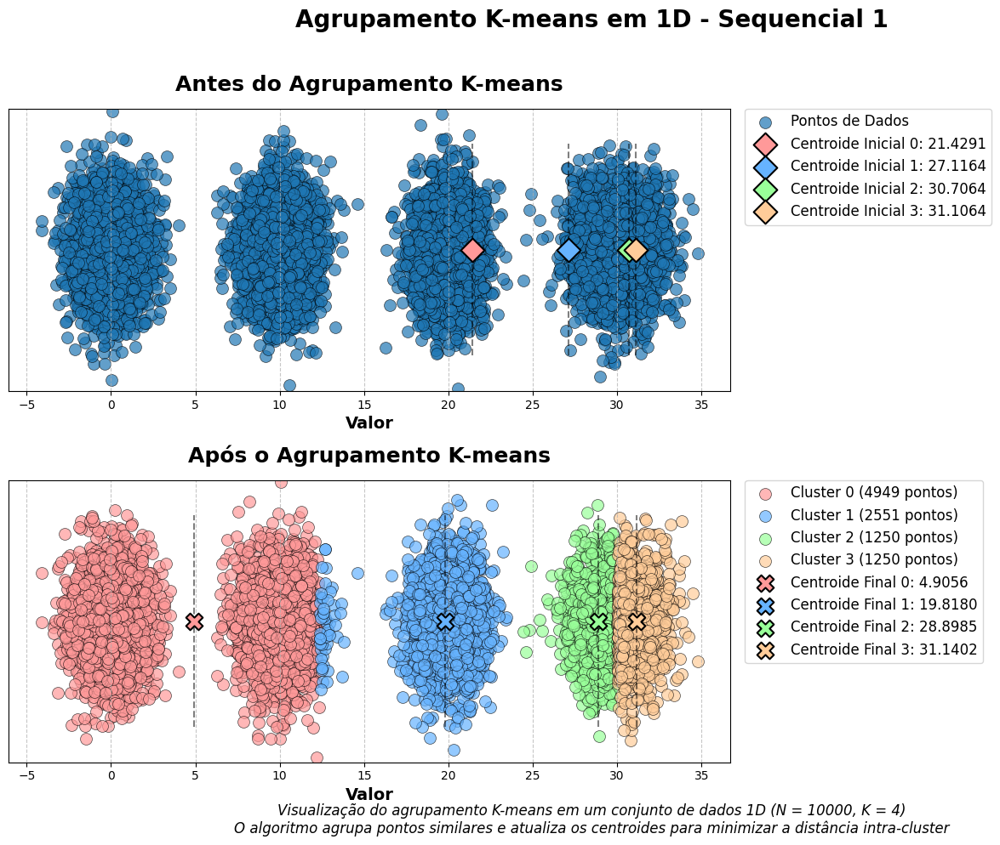

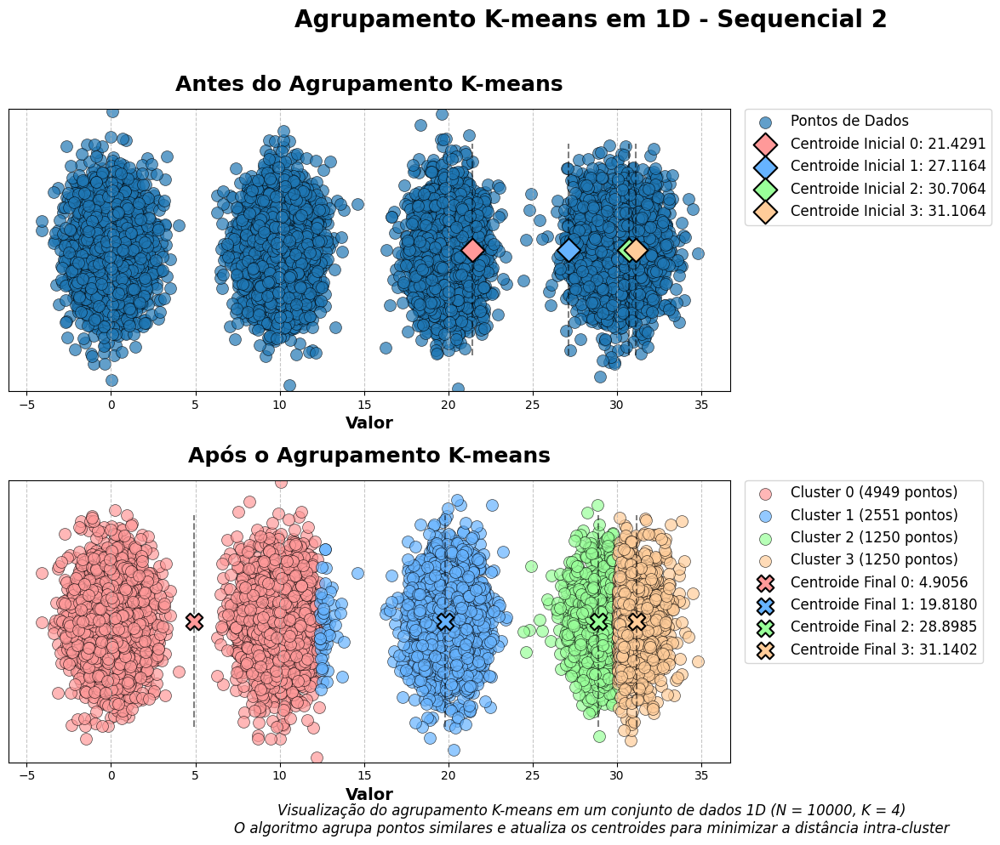

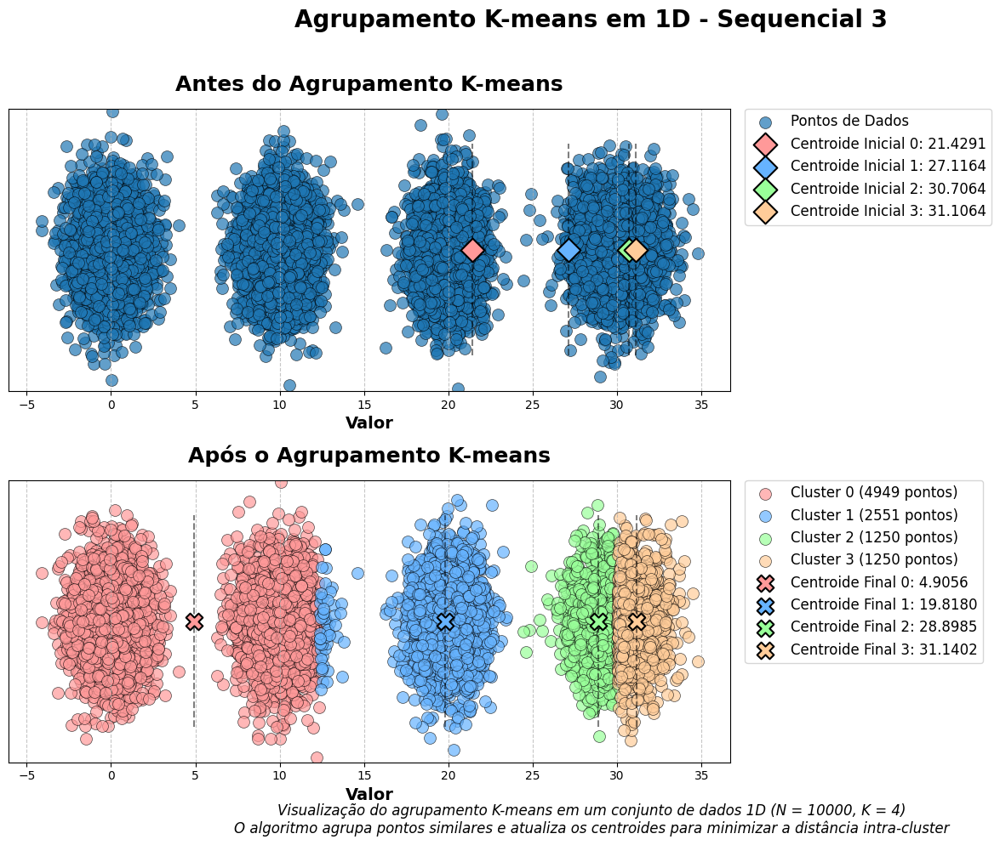

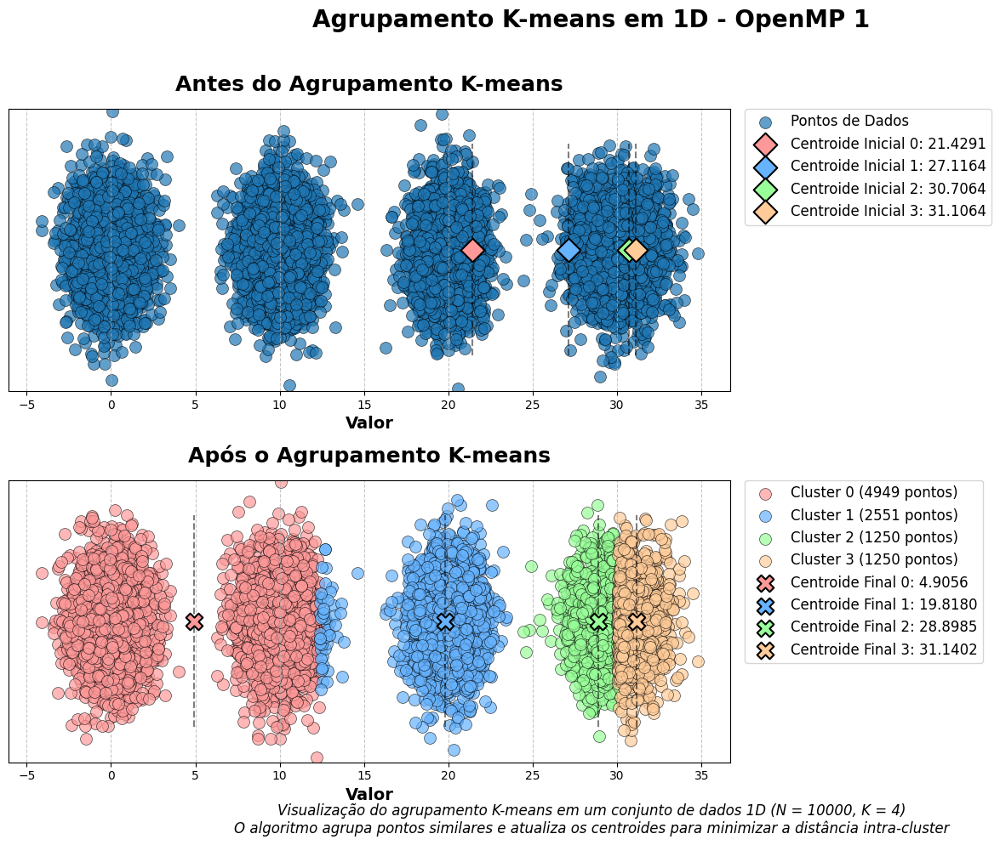

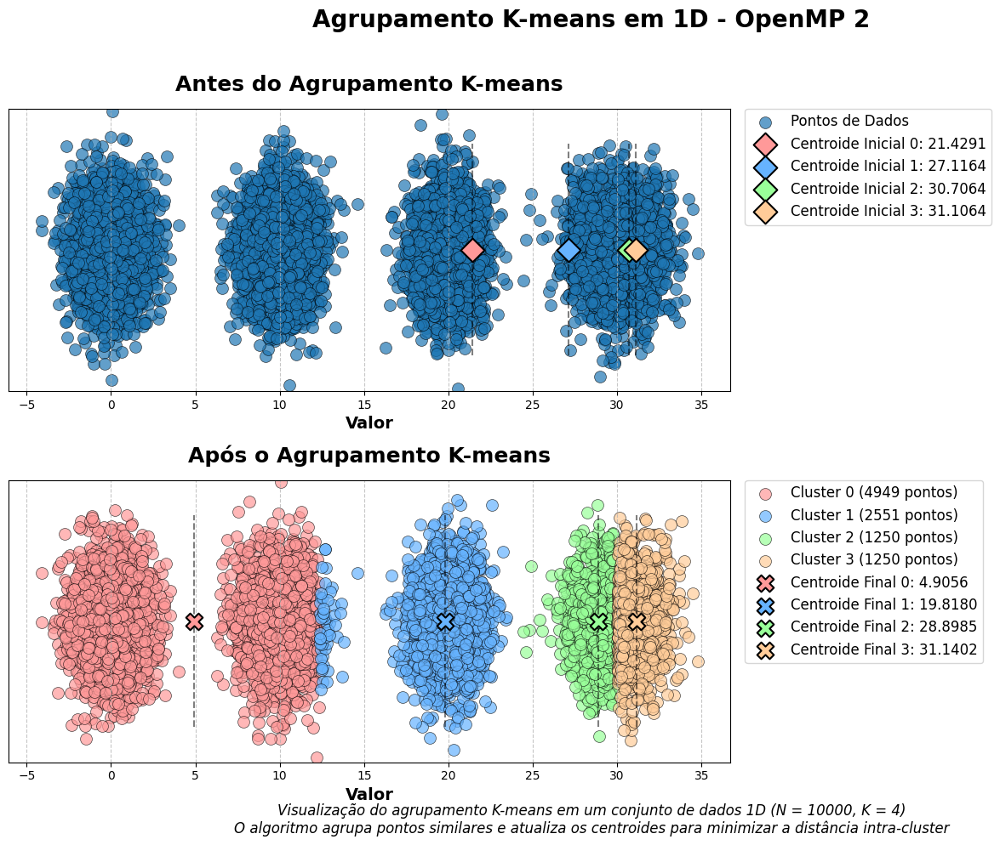

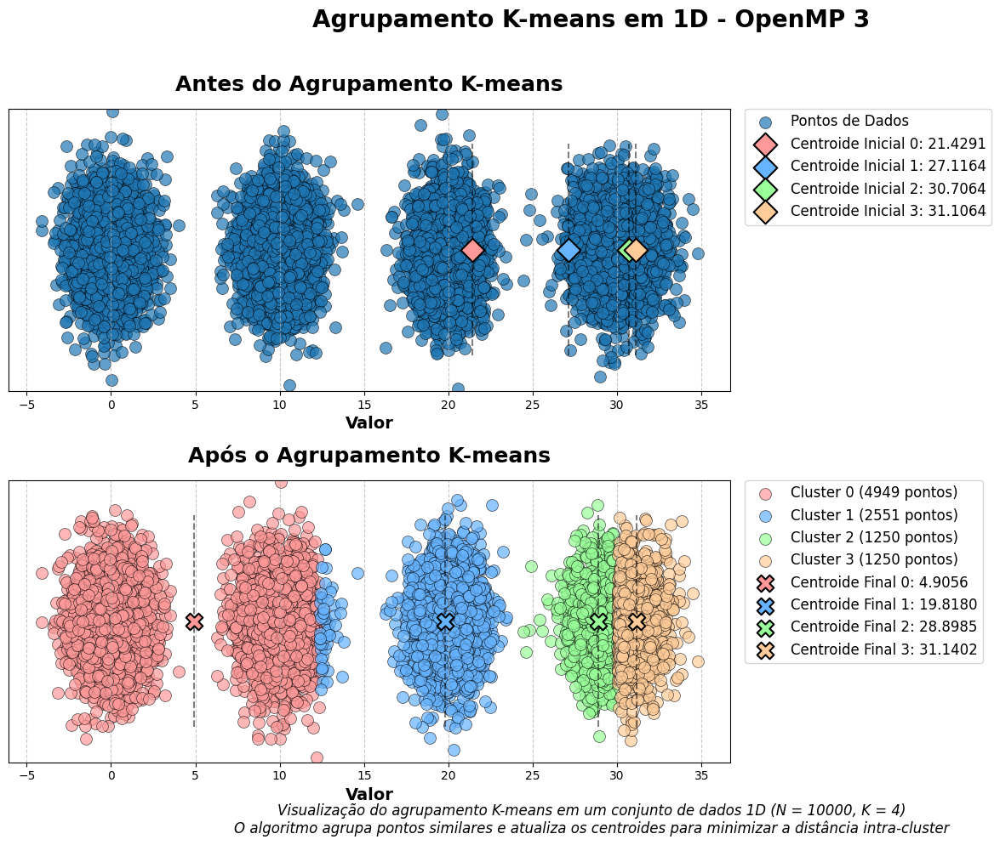

In [ ]:
# Load data
points = np.loadtxt('../data/data/points_10000.csv')
initial_centers = np.loadtxt('../data/data/centers_4.csv')

N = len(points)
K = len(initial_centers)

assignments_sequential_1 = np.loadtxt('../versions/sequential/data/validation/assigns_1.csv').astype(int)
final_centroids_sequential_1 = np.loadtxt('../versions/sequential/data/validation/centroids_1.csv')

assignments_sequential_2 = np.loadtxt('../versions/sequential/data/validation/assigns_2.csv').astype(int)
final_centroids_sequential_2 = np.loadtxt('../versions/sequential/data/validation/centroids_2.csv')

assignments_sequential_3 = np.loadtxt('../versions/sequential/data/validation/assigns_3.csv').astype(int)
final_centroids_sequential_3 = np.loadtxt('../versions/sequential/data/validation/centroids_3.csv')

assignments_openmp_1 = np.loadtxt('../versions/openmp/data/validation/assigns_1.csv').astype(int)
final_centroids_openmp_1 = np.loadtxt('../versions/openmp/data/validation/centroids_1.csv')

assignments_openmp_2 = np.loadtxt('../versions/openmp/data/validation/assigns_2.csv').astype(int)
final_centroids_openmp_2 = np.loadtxt('../versions/openmp/data/validation/centroids_2.csv')

assignments_openmp_3 = np.loadtxt('../versions/openmp/data/assigns_3.csv').astype(int)
final_centroids_openmp_3 = np.loadtxt('../versions/openmp/data/centroids_3.csv')


visualize_kmeans_1d(points, initial_centers, assignments_sequential_1, final_centroids_sequential_1, N, K, "- Sequencial 1")
visualize_kmeans_1d(points, initial_centers, assignments_sequential_2, final_centroids_sequential_2, N, K, "- Sequencial 2")
visualize_kmeans_1d(points, initial_centers, assignments_sequential_3, final_centroids_sequential_3, N, K, "- Sequencial 3")

visualize_kmeans_1d(points, initial_centers, assignments_openmp_1, final_centroids_openmp_1, N, K, "- OpenMP 1")
visualize_kmeans_1d(points, initial_centers, assignments_openmp_2, final_centroids_openmp_2, N, K, "- OpenMP 2")
visualize_kmeans_1d(points, initial_centers, assignments_openmp_3, final_centroids_openmp_3, N, K, "- OpenMP 3")

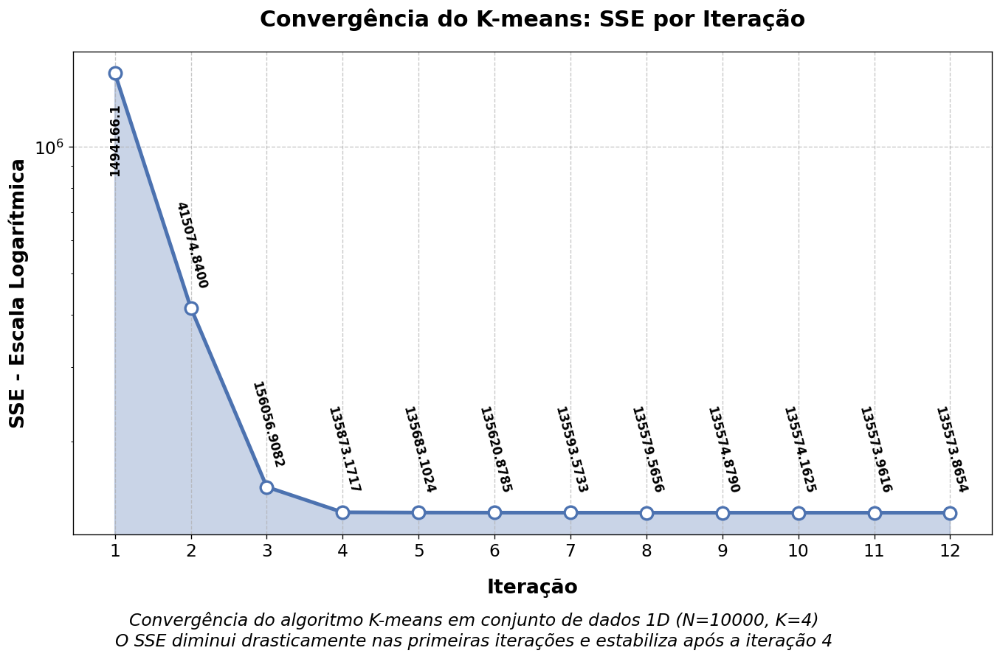

In [31]:
iterations = list(range(1, 13))
sse_values = [1494166.087593, 415074.839994, 156056.908211, 135873.171657, 135683.102384, 
              135620.878542, 135593.573303, 135579.565627, 135574.878982, 135574.162487,
              135573.961586, 135573.865418]

plot_kmeans_convergence(iterations, sse_values)

## Tuning

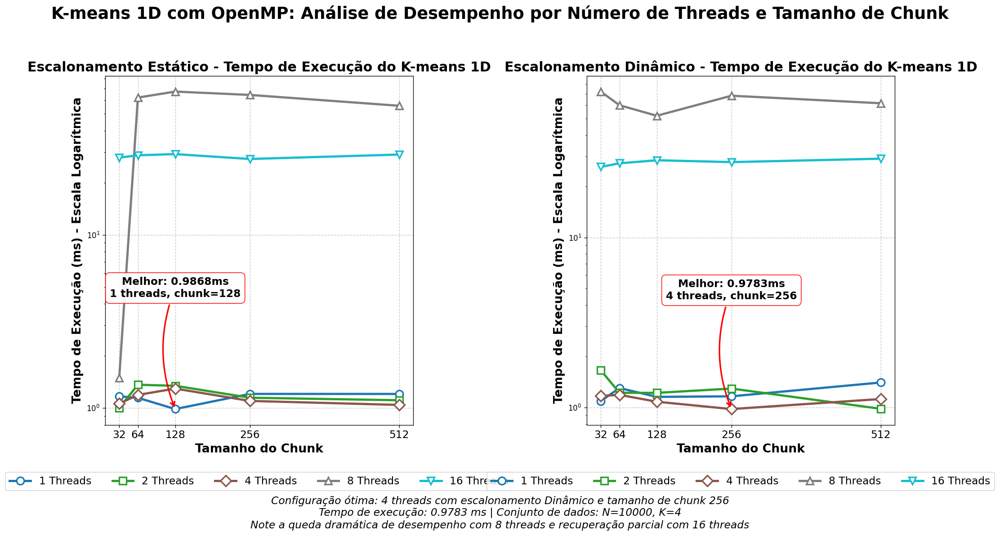

In [39]:
threads = [1, 2, 4, 8, 16]
chunk_sizes = [32, 64, 128, 256, 512]

static_times = np.array([
    [1.168612, 1.146086, 0.986821, 1.206953, 1.206486],  # 1 thread
    [1.001679, 1.363172, 1.344724, 1.147083, 1.109510],  # 2 threads
    [1.060852, 1.191511, 1.295245, 1.099626, 1.042413],  # 4 threads
    [1.497286, 62.120319, 67.265184, 64.338856, 55.697604],  # 8 threads
    [27.931807, 28.839499, 29.281464, 27.452096, 29.114906]  # 16 threads
])

dynamic_times = np.array([
    [1.090472, 1.300618, 1.153785, 1.162695, 1.401824],  # 1 thread
    [1.653876, 1.219310, 1.218203, 1.291522, 0.981639],  # 2 threads
    [1.168160, 1.185770, 1.080412, 0.978276, 1.120877],  # 4 threads
    [72.166204, 59.987131, 52.014781, 68.224747, 61.616373],  # 8 threads
    [26.009412, 27.314074, 28.466284, 27.757381, 29.074750]  # 16 threads
])

plot_openmp_performance(threads, chunk_sizes, static_times, dynamic_times)

## Runs

/tmp/ipykernel_11126/2701017463.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('tab20' if K <= 20 else 'gist_rainbow', K)
/tmp/ipykernel_11126/2701017463.py:49: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax2.scatter(cluster_points, cluster_y, alpha=0.7, s=100, c=colors[i],


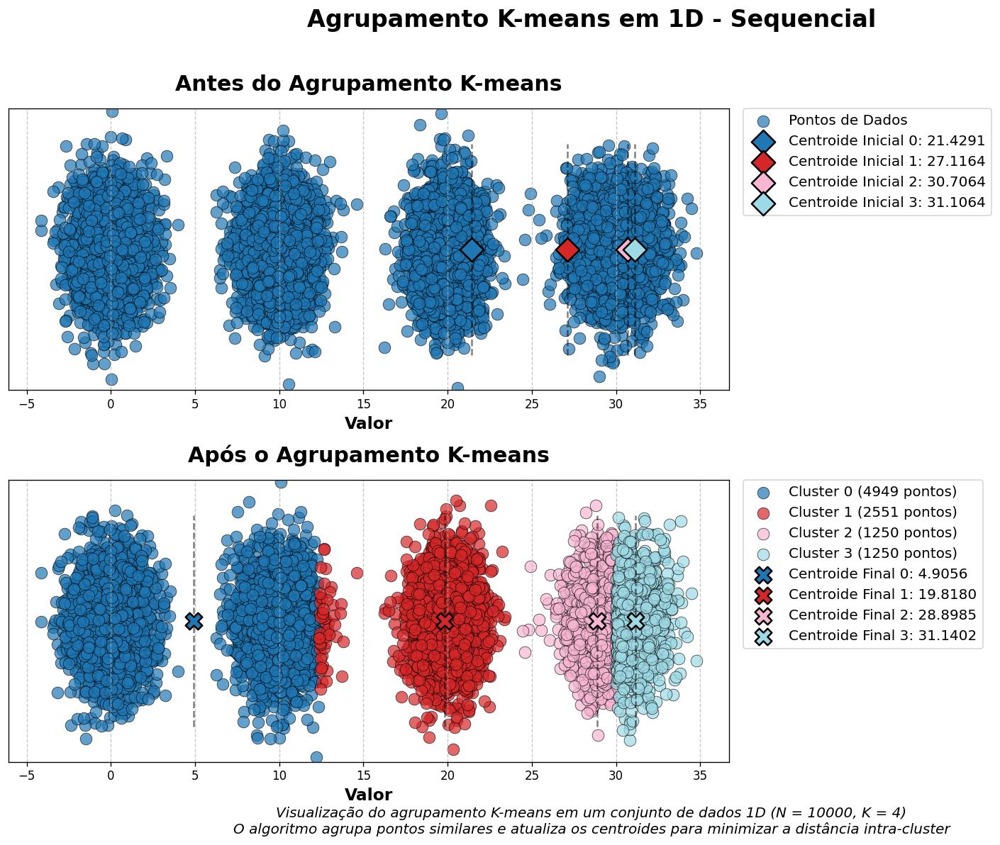

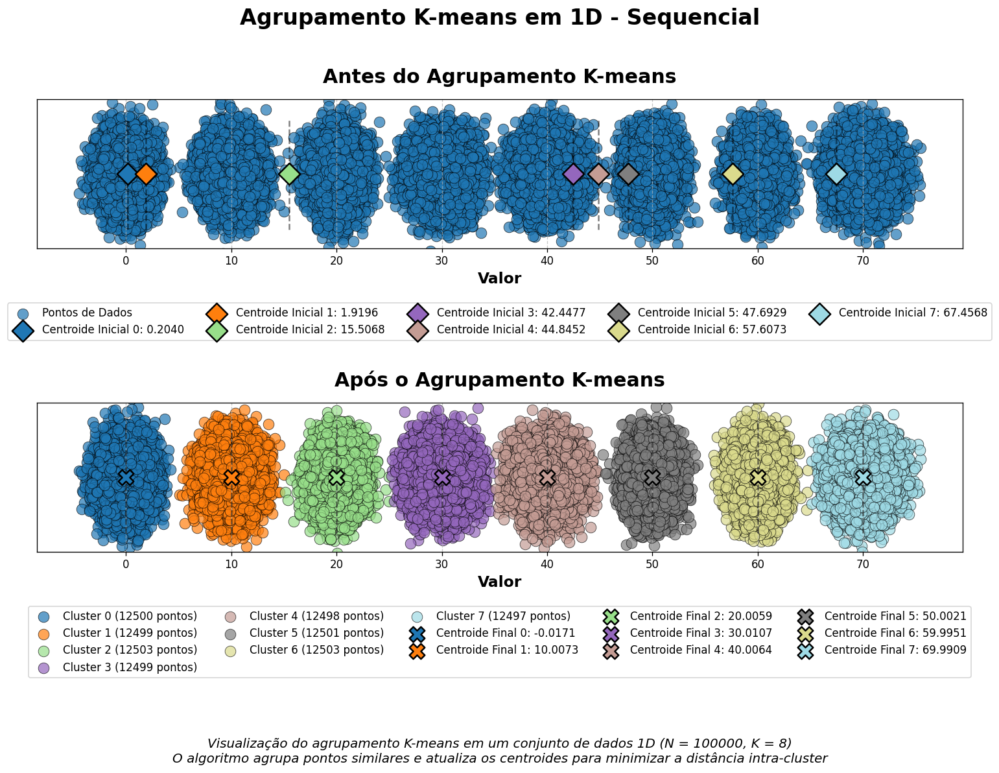

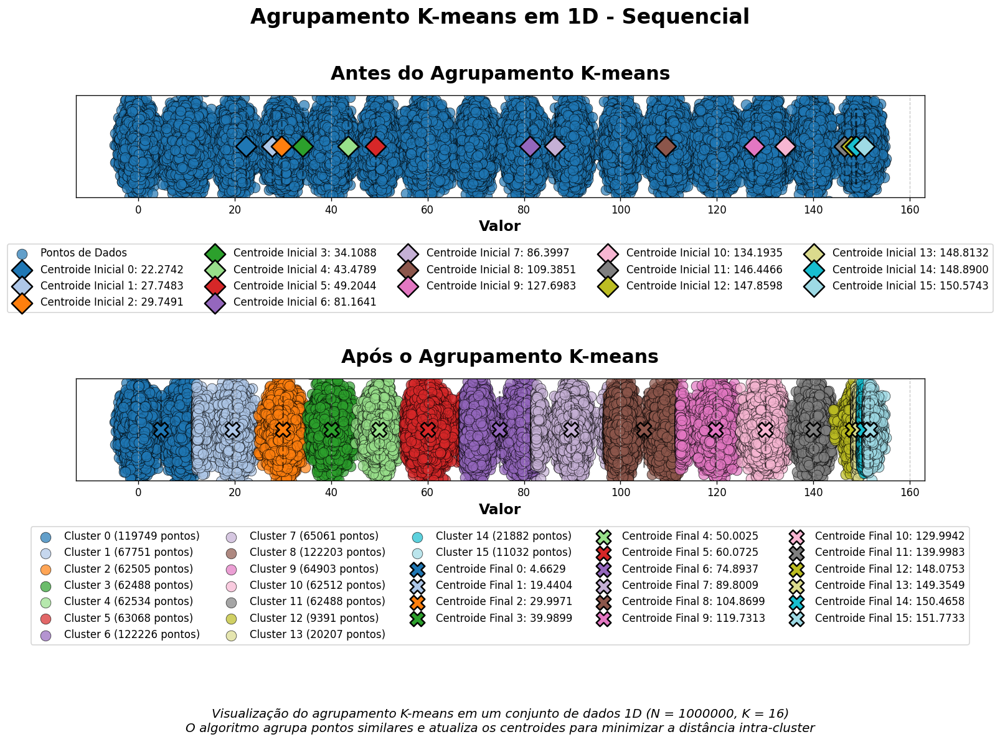

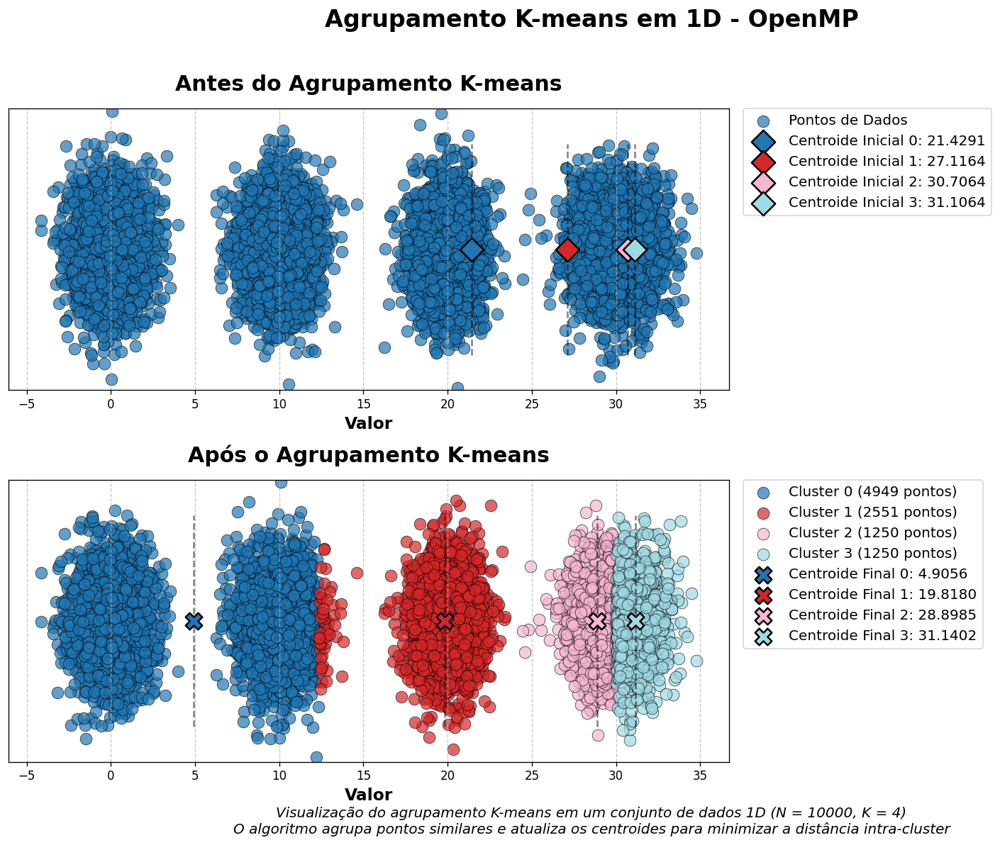

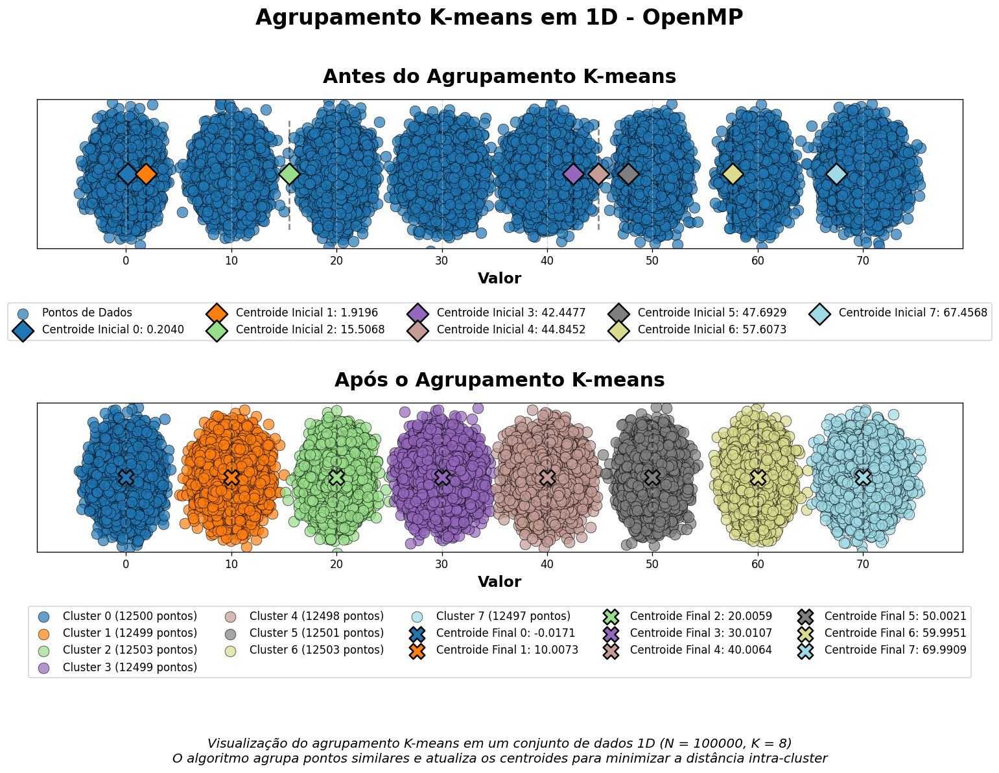

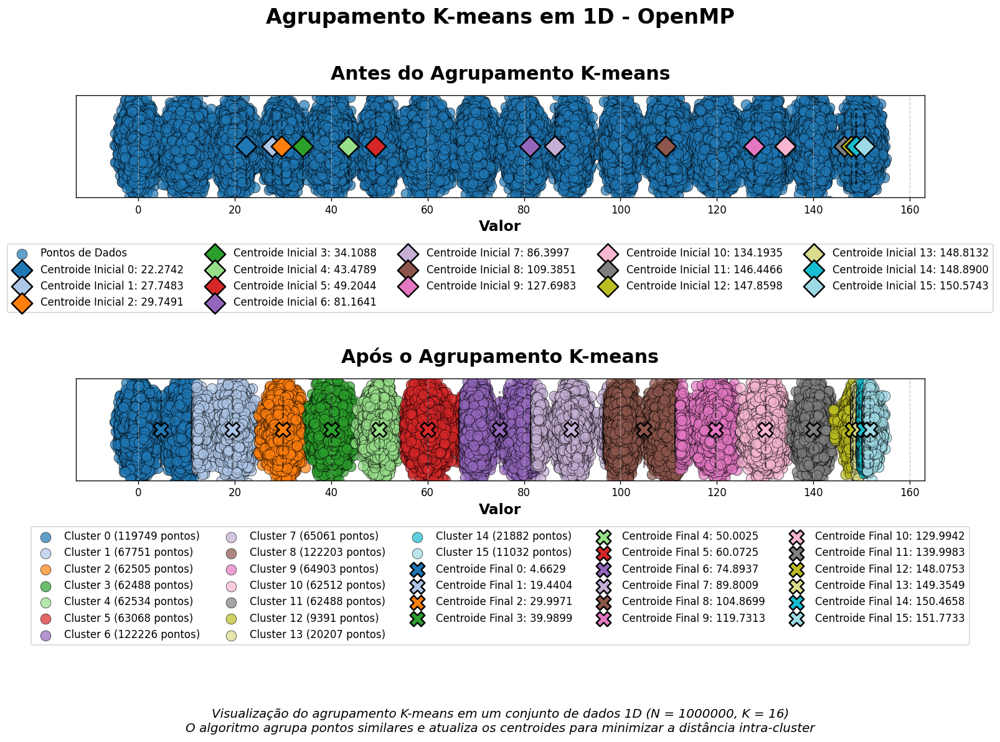

In [98]:
# Load data
points_10000 = np.loadtxt('../data/data/points_10000.csv')
initial_centers_4 = np.loadtxt('../data/data/centers_4.csv')

points_100000 = np.loadtxt('../data/data/points_100000.csv')
initial_centers_8 = np.loadtxt('../data/data/centers_8.csv')

points_1000000 = np.loadtxt('../data/data/points_1000000.csv')
initial_centers_16 = np.loadtxt('../data/data/centers_16.csv')

N_10000 = len(points_10000)
K_4 = len(initial_centers_4)

N_100000 = len(points_100000)
K_8 = len(initial_centers_8)

N_1000000 = len(points_1000000)
K_16 = len(initial_centers_16)

assignments_sequential_10000 = np.loadtxt('../versions/sequential/data/run/assigns_10000_4.csv').astype(int)
final_centroids_sequential_10000 = np.loadtxt('../versions/sequential/data/run/centroids_10000_4.csv')

assignments_sequential_100000 = np.loadtxt('../versions/sequential/data/run/assigns_100000_8.csv').astype(int)
final_centroids_sequential_100000 = np.loadtxt('../versions/sequential/data/run/centroids_100000_8.csv')

assignments_sequential_1000000 = np.loadtxt('../versions/sequential/data/run/assigns_1000000_16.csv').astype(int)
final_centroids_sequential_1000000 = np.loadtxt('../versions/sequential/data/run/centroids_1000000_16.csv')

assignments_openmp_10000 = np.loadtxt('../versions/openmp/data/run/assigns_10000_4.csv').astype(int)
final_centroids_openmp_10000 = np.loadtxt('../versions/openmp/data/run/centroids_10000_4.csv')

assignments_openmp_100000 = np.loadtxt('../versions/openmp/data/run/assigns_100000_8.csv').astype(int)
final_centroids_openmp_100000 = np.loadtxt('../versions/openmp/data/run/centroids_100000_8.csv')

assignments_openmp_1000000 = np.loadtxt('../versions/openmp/data/run/assigns_1000000_16.csv').astype(int)
final_centroids_openmp_1000000 = np.loadtxt('../versions/openmp/data/run/centroids_1000000_16.csv')


visualize_kmeans_1d(points_10000, initial_centers_4, assignments_sequential_10000, final_centroids_sequential_10000, N_10000, K_4, "- Sequencial")
visualize_kmeans_1d(points_100000, initial_centers_8, assignments_sequential_100000, final_centroids_sequential_100000, N_100000, K_8, "- Sequencial")
visualize_kmeans_1d(points_1000000, initial_centers_16, assignments_sequential_1000000, final_centroids_sequential_1000000, N_1000000, K_16, "- Sequencial")

visualize_kmeans_1d(points_10000, initial_centers_4, assignments_openmp_10000, final_centroids_openmp_10000, N_10000, K_4, "- OpenMP")
visualize_kmeans_1d(points_100000, initial_centers_8, assignments_openmp_100000, final_centroids_openmp_100000, N_100000, K_8, "- OpenMP")
visualize_kmeans_1d(points_1000000, initial_centers_16, assignments_openmp_1000000, final_centroids_openmp_1000000, N_1000000, K_16, "- OpenMP")

Sequential:
Iterações: 12 | SSE final: 135573.865418 | Tempo: 0.865000 ms
Iterações: 6 | SSE final: 158856.948317 | Tempo: 5.400000 ms
Iterações: 25 | SSE final: 10743954.610449 | Tempo: 420.469000 ms


OpenMP (2 threads, chunk size 256, dynamic scheduling):
Iterações: 12 | SSE final: 135573.865418
Tempo (omp_get_wtime): 1.165509 ms
Iterações: 6 | SSE final: 158856.948317
Tempo (omp_get_wtime): 3.324995 ms
Iterações: 25 | SSE final: 10743954.610448
Tempo (omp_get_wtime): 184.267238 ms

In [43]:
print(0.865000 / 1.165509,
5.400000 / 3.324995,
420.469000 / 184.267238)

0.742165011166795 1.6240625925753274 2.2818435038354457
